## Visualization of CNN: Grad-CAM
* **Objective**: Convolutional Neural Networks are widely used on computer vision. It is powerful for processing grid-like data. However we hardly know how and why it works, due to the lack of decomposability into individually intuitive components. In this assignment, we use Grad-CAM, which highlights the regions of the input image that were important for the neural network prediction.


* NB: if `PIL` is not installed, try `conda install pillow`.

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, datasets, transforms
import matplotlib.pyplot as plt
import pickle
import urllib.request

import numpy as np
from PIL import Image

%matplotlib inline

### Download the Model
We provide you a pretrained model `ResNet-34` for `ImageNet` classification dataset.
* **ImageNet**: A large dataset of photographs with 1 000 classes.
* **ResNet-34**: A deep architecture for image classification.

In [ ]:
resnet34 = models.resnet34(weights='ResNet34_Weights.IMAGENET1K_V1')  # New PyTorch interface for loading weights!
resnet34.eval() # set the model to evaluation mode

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:01<00:00, 58.4MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

![ResNet34](https://miro.medium.com/max/1050/1*Y-u7dH4WC-dXyn9jOG4w0w.png)


Input image must be of size (3x224x224).

First convolution layer with maxpool.
Then 4 ResNet blocks.

Output of the last ResNet block is of size (512x7x7).

Average pooling is applied to this layer to have a 1D array of 512 features fed to a linear layer that outputs 1000 values (one for each class). No softmax is present in this case. We have already the raw class score!

In [ ]:
classes = pickle.load(urllib.request.urlopen('https://gist.githubusercontent.com/yrevar/6135f1bd8dcf2e0cc683/raw/d133d61a09d7e5a3b36b8c111a8dd5c4b5d560ee/imagenet1000_clsid_to_human.pkl'))

##classes is a dictionary with the name of each class
print(classes)

{0: 'tench, Tinca tinca', 1: 'goldfish, Carassius auratus', 2: 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias', 3: 'tiger shark, Galeocerdo cuvieri', 4: 'hammerhead, hammerhead shark', 5: 'electric ray, crampfish, numbfish, torpedo', 6: 'stingray', 7: 'cock', 8: 'hen', 9: 'ostrich, Struthio camelus', 10: 'brambling, Fringilla montifringilla', 11: 'goldfinch, Carduelis carduelis', 12: 'house finch, linnet, Carpodacus mexicanus', 13: 'junco, snowbird', 14: 'indigo bunting, indigo finch, indigo bird, Passerina cyanea', 15: 'robin, American robin, Turdus migratorius', 16: 'bulbul', 17: 'jay', 18: 'magpie', 19: 'chickadee', 20: 'water ouzel, dipper', 21: 'kite', 22: 'bald eagle, American eagle, Haliaeetus leucocephalus', 23: 'vulture', 24: 'great grey owl, great gray owl, Strix nebulosa', 25: 'European fire salamander, Salamandra salamandra', 26: 'common newt, Triturus vulgaris', 27: 'eft', 28: 'spotted salamander, Ambystoma maculatum', 29: 'axolotl, mu

### Input Images
We provide you 20 images from ImageNet (download link on the webpage of the course or download directly using the following command line,).<br>
In order to use the pretrained model resnet34, the input image should be normalized using `mean = [0.485, 0.456, 0.406]`, and `std = [0.229, 0.224, 0.225]`, and be resized as `(224, 224)`.

In [ ]:
def preprocess_image(dir_path):
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])
    # Note: If the inverse normalisation is required, apply 1/x to the above object

    dataset = datasets.ImageFolder(dir_path, transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224), # resize the image to 224x224
            transforms.ToTensor(), # convert numpy.array to tensor
            normalize])) #normalize the tensor

    return (dataset)

In [ ]:
import os
if not os.path.exists("data"):
    os.mkdir("data")
if not os.path.exists("data/TP2_images"):
    os.mkdir("data/TP2_images")
    !cd data/TP2_images && wget "https://www.lri.fr/~gcharpia/deeppractice/2023/TP2/TP2_images.zip" && unzip TP2_images.zip

dir_path = "data/"
dataset = preprocess_image(dir_path)

--2024-03-06 17:11:23--  https://www.lri.fr/~gcharpia/deeppractice/2023/TP2/TP2_images.zip
Resolving www.lri.fr (www.lri.fr)... 129.175.15.11
Connecting to www.lri.fr (www.lri.fr)|129.175.15.11|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1477062 (1.4M) [application/zip]
Saving to: ‘TP2_images.zip’

TP2_images.zip      100%[===================>]   1.41M  2.89MB/s    in 0.5s    

2024-03-06 17:11:25 (2.89 MB/s) - ‘TP2_images.zip’ saved [1477062/1477062]

Archive:  TP2_images.zip
   creating: .ipynb_checkpoints/
  inflating: 155881293_721e90b57d.jpg  
  inflating: 158850087_3251644046.jpg  
  inflating: 1624593475_146bf1f7ff.jpg  
  inflating: 181748579_01a4611736.jpg  
  inflating: 2068921624_ef0986de13.jpg  
  inflating: 2637374064_fab14ec0b8.jpg  
  inflating: 2749465889_8e62023674.jpg  
  inflating: 2936812850_23bf0d1cfd.jpg  
  inflating: 3532471222_a6d7e3780e.jpg  
  inflating: 3633913271_ee789a3bc4.jpg  
  inflating: 3633949157_f577605ea9.jpg  
  infla

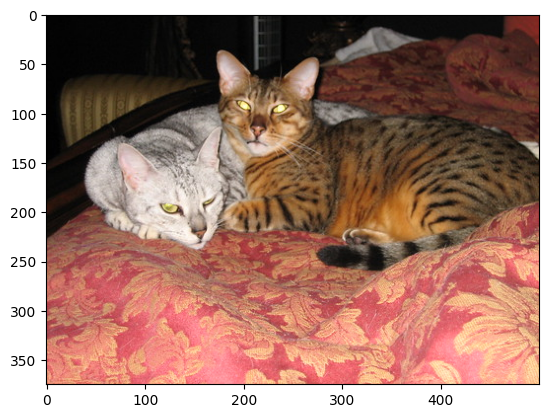

In [ ]:
# show the orignal image
index = 5
input_image = Image.open(dataset.imgs[index][0]).convert('RGB')
plt.imshow(input_image)

In [ ]:
output = resnet34(dataset[index][0].view(1, 3, 224, 224))
values, indices = torch.topk(output, 3)
print("Top 3-classes:", indices[0].numpy(), [classes[x] for x in indices[0].numpy()])
print("Raw class scores:", values[0].detach().numpy())

Top 3-classes: [285 281 282] ['Egyptian cat', 'tabby, tabby cat', 'tiger cat']
Raw class scores: [13.175314 11.065537 10.584748]


### Grad-CAM
* **Overview:** Given an image, and a category (‘tiger cat’) as input, we forward-propagate the image through the model to obtain the `raw class scores` before softmax. The gradients are set to zero for all classes except the desired class (tiger cat), which is set to 1. This signal is then backpropagated to the `rectified convolutional feature map` of interest, where we can compute the coarse Grad-CAM localization (blue heatmap).


* **To Do**: Define your own function Grad_CAM to achieve the visualization of the given images. For each image, choose the top-3 possible labels as the desired classes. Compare the heatmaps of the three classes, and conclude.


* **To be submitted within 2 weeks**: this notebook, **cleaned** (i.e. without results, for file size reasons: `menu > kernel > restart and clean`), in a state ready to be executed (if one just presses 'Enter' till the end, one should obtain all the results for all images) with a few comments at the end. No additional report, just the notebook!


* **Hints**:
 + We need to record the output and grad_output of the feature maps to achieve Grad-CAM. In pytorch, the function `Hook` is defined for this purpose. Read the tutorial of [hook](https://pytorch.org/tutorials/beginner/former_torchies/nnft_tutorial.html#forward-and-backward-function-hooks) carefully.
 + More on [autograd](https://pytorch.org/tutorials/beginner/basics/autogradqs_tutorial.html) and [hooks](https://pytorch.org/tutorials/beginner/former_torchies/nnft_tutorial.html#forward-and-backward-function-hooks)
 + The pretrained model resnet34 doesn't have an activation function after its last layer, the output is indeed the `raw class scores`, you can use them directly.
 + The size of feature maps is 7x7, so your heatmap will have the same size. You need to project the heatmap to the resized image (224x224, not the original one, before the normalization) to have a better observation. The function [`torch.nn.functional.interpolate`](https://pytorch.org/docs/stable/nn.functional.html?highlight=interpolate#torch.nn.functional.interpolate) may help.  
 + Here is the link of the paper [Grad-CAM: Visual Explanations from Deep Networks via Gradient-based Localization](https://arxiv.org/pdf/1610.02391.pdf)

Class: ‘pug, pug-dog’ | Class: ‘tabby, tabby cat’
- | -
![alt](https://raw.githubusercontent.com/jacobgil/pytorch-grad-cam/master/examples/dog.jpg)| ![alt](https://raw.githubusercontent.com/jacobgil/pytorch-grad-cam/master/examples/cat.jpg)

### Complementary questions:

##### Try GradCAM on others convolutional layers, describe and comment the results

In what follows we code Grad-Cam as presiced in the given article.


In [ ]:
import cv2

Comments about the code of GradCam:
I choose to do it oriented object so I can more easily play with the layers I choose to use for GradCam.

The first part is tested when we apply GradCam on the vey last layer and the second part is when we apply it to the very first and middle layer.

In [ ]:

class GradCAM:
    def __init__(self, model, layer):
        self.model = model
        self.layer=layer
        self.gradients = None
        self.activation = None
        self.model.eval()
        self.register_hooks()

    def register_hooks(self):
        def backward_hook(module, grad_in, grad_out):
            self.gradients = grad_out[0]

        def forward_hook(module, input, output):
            self.activation = output

        # Register hook to the selected layer
        layer=self.layer
        layer.register_forward_hook(forward_hook)
        layer.register_backward_hook(backward_hook)

    def generate_cam(self, input_image, target_class):
        # Forward pass
        output = self.model(input_image)
        if not target_class: #Condition to predict automatically the best class if target_class==None
            target_class = np.argmax(output.cpu().data.numpy())
        # Zero gradients
        self.model.zero_grad()
        # Target for backprop
        one_hot_output = torch.FloatTensor(1, output.size()[-1]).zero_()
        one_hot_output[0][target_class] = 1
        # Backward pass
        output.backward(gradient=one_hot_output)
        # Generate CAM
        gradients = self.gradients.cpu().data.numpy()[0]
        activations = self.activation.cpu().data.numpy()[0]
        weights = np.mean(gradients, axis=(1, 2))

        cam = np.zeros(activations.shape[1:], dtype=np.float32)
        #Coding of the grad-gam as explained in the article
        for i, w in enumerate(weights):
            cam += w * activations[i, :, :]

        cam = np.maximum(cam, 0) #RELU as done in the article
        cam = cv2.resize(cam, (224, 224))
        #Renormalization also as done in the article
        cam = cam - np.min(cam)
        cam = cam / np.max(cam)
        return cam

def preprocess_single_image(img_path):
    preprocess = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    image = Image.open(img_path).convert("RGB")
    image_tensor = preprocess(image).unsqueeze(0)
    return image_tensor
#show_heat plots the heat map
def show_heat(img_path, mask, display=True):
    img = cv2.imread(img_path)
    img = cv2.resize(img, (224, 224))
    heatmap = cv2.applyColorMap(np.uint8(255 * mask), cv2.COLORMAP_JET)
    cam = heatmap * 0.4 + img * 0.6
    cam = cam / cam.max() * 255
    cam = np.uint8(cam)
    if display:
        plt.imshow(cv2.cvtColor(cam, cv2.COLOR_BGR2RGB) / 255.0)
        plt.axis('off')
    else:
        return cv2.cvtColor(cam, cv2.COLOR_BGR2RGB) / 255.0


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1359: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward

Text(0.5, 1.0, 'GradCam on last layer')

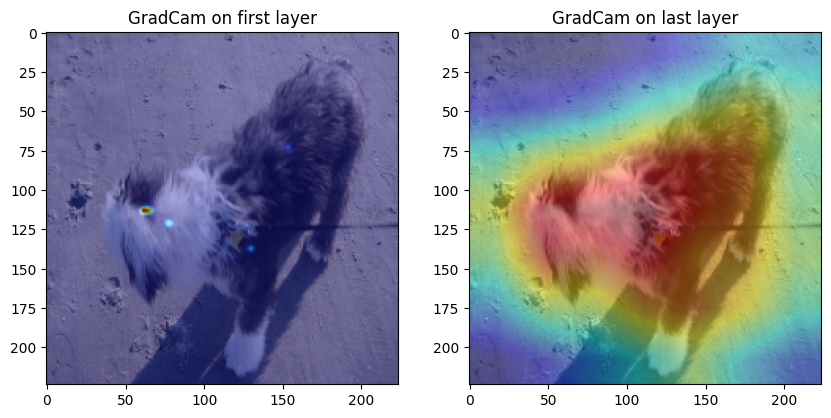

In [ ]:
img_path = dataset.imgs[2][0] #Choose the 3st image of the dataset
input_img = preprocess_single_image(img_path)

model = models.resnet34(pretrained=True)
grad_cam_final_layer = GradCAM(model, layer= model.layer4[-1])
grad_cam_firs_layer=GradCAM(model,layer=model.layer1[0])

#Plot the predicted class
outputs=model(input_img)
cam_final = grad_cam_final_layer.generate_cam(input_img, target_class=None) #Select the best class

cam_first=grad_cam_firs_layer.generate_cam(input_img, target_class=None) #Select the best class

heatmap_img_first = show_heat(img_path, cam_first, display=False)
heatmap_last=show_heat(img_path, cam_final, display=False)

#plot of the heatmap
fig, axs = plt.subplots(1,2, figsize=(10, 5))
axs[0].imshow(heatmap_img_first)
axs[1].imshow(heatmap_last)
axs[0].set_title('GradCam on first layer')
axs[1].set_title('GradCam on last layer')

Here we plot the heat map for each example and for the best prediction

In [ ]:
import matplotlib.pyplot as plt
#plot function adapted to plot heatmap
def plot_images_and_heatmaps(image_files, model, grad_cam, classes, preprocess_single_image, show_cam):
    num_images = len(image_files)
    #define the number of columns
    cols = 4

    for i, img_path in enumerate(image_files):
        input_img = preprocess_single_image(img_path)

        outputs = model(input_img)
        topk_value, topk_indices = torch.topk(outputs, 3, dim=1)
        topk_indices = topk_indices.detach().cpu().numpy().flatten()

        fig, axs = plt.subplots(1, cols, figsize=(20, 5))
        axs[0].imshow(Image.open(img_path))
        axs[0].set_title(f'Image {i+1}')
        axs[0].axis('off')

        for j, idx in enumerate(topk_indices, start=1):
            cam = grad_cam.generate_cam(input_img, target_class=idx)
            heatmap_img = show_heat(img_path, cam, display=False)
            axs[j].imshow(heatmap_img)
            class_name = classes[idx]
            axs[j].set_title(f'{class_name}')
            axs[j].axis('off')

        plt.show()



Here we use the last layer of the last block.

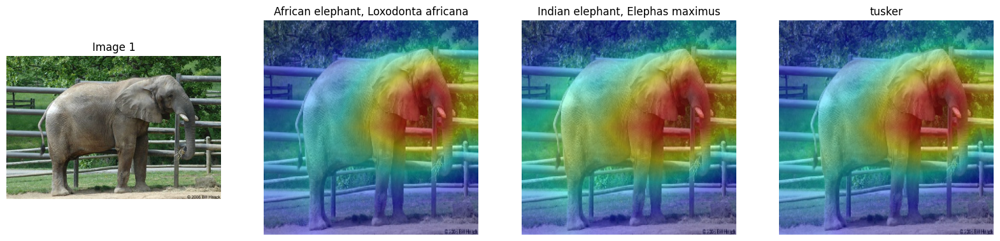

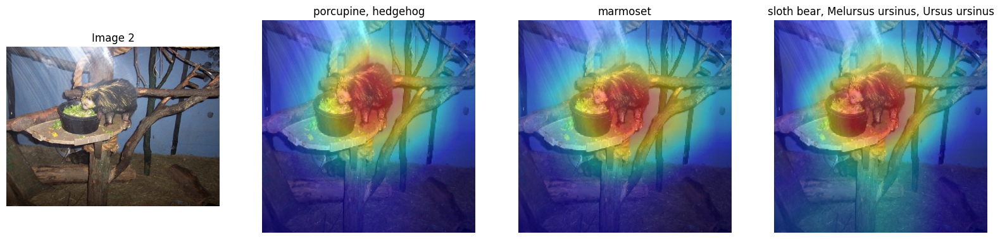

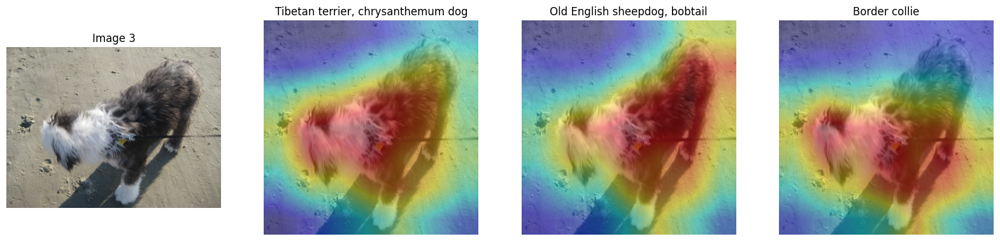

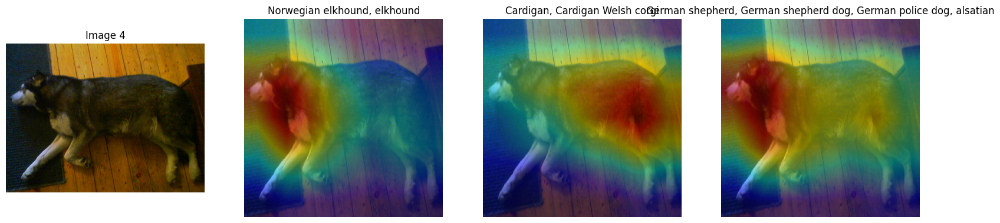

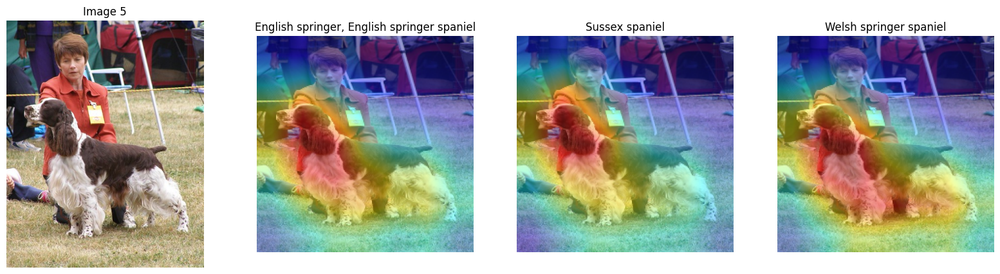

...

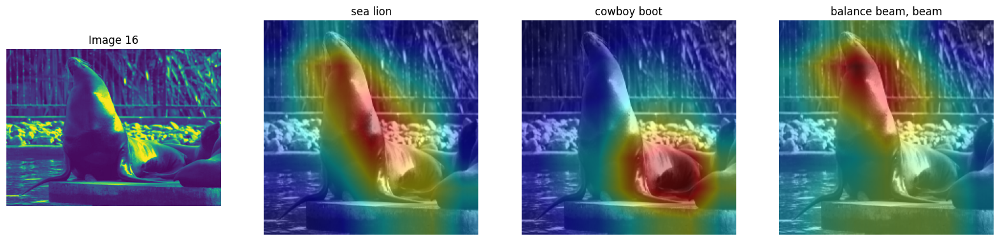

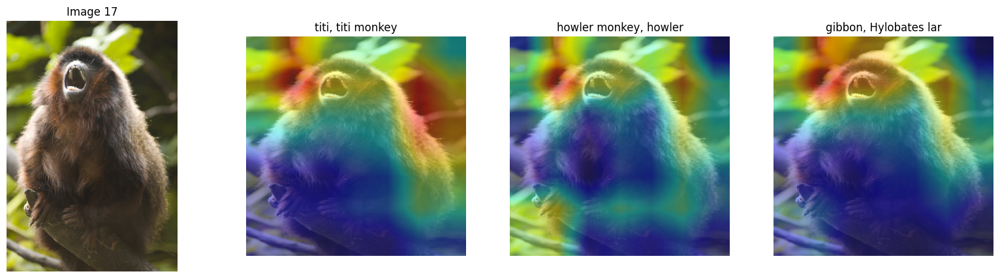

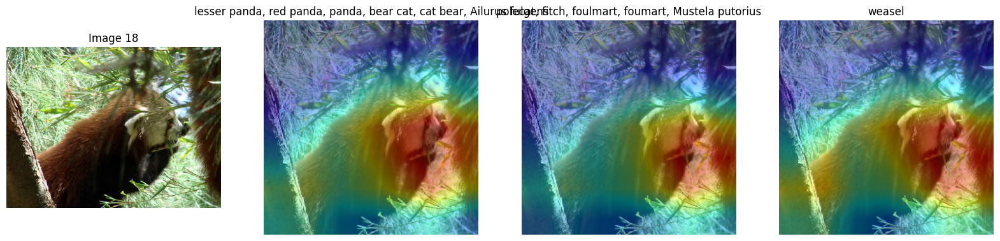

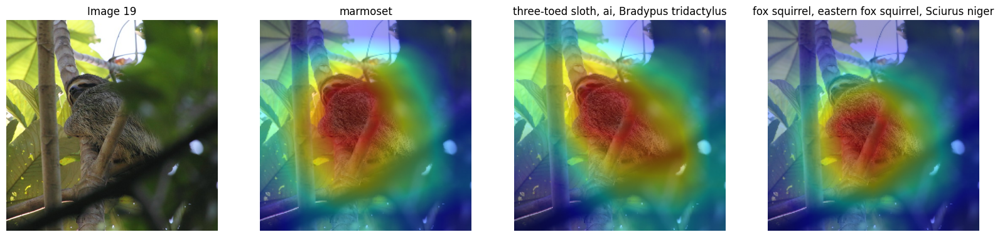

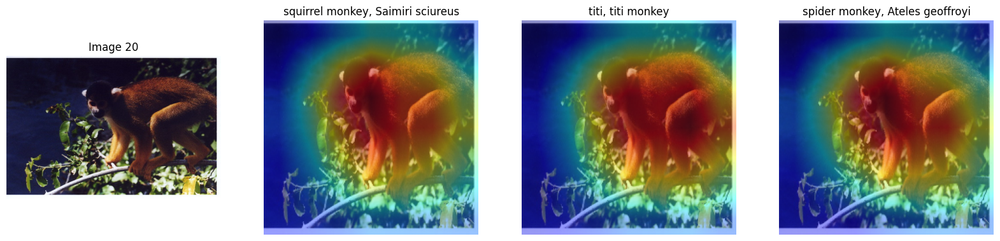

In [ ]:
image_files=[dataset.imgs[k][0] for k in range(20)]

# Initialisation du modèle et de GradCAM
model = models.resnet34(pretrained=True)
grad_cam = GradCAM(model, layer=model.layer4[-1])

# Appel de la fonction pour afficher les images et les heatmaps
plot_images_and_heatmaps(image_files[:20], model, grad_cam, classes, preprocess_single_image, show_heat)

Comments:
Analyzing the 20 samples rendered by gradCam when applied to the last layer of the neural network, we observed several interesting things.

**Let's take the cases where the network is most confident**
Sometimes the network uses all the body and sometimes it doesn't.
For example, in image 4, only the dog's head is used, whereas in image 15, the whole of the puma's body is used, and the same applies to image 10. It also happens that a large part of the image where the animal does not appear is used : Image 13 and Image 17.
Surprisingly, "counter-intuitive" zones are used predominantly for image 13 and 12. The red areas are almost never the face or they include non sens zone (see red zone for the red wolf prediction in image 12)

**Now, let's take the cases where the network is less confident**

Note that gradcam's zones of interest change, and the predictions are sometimes wrong, even to the point of predicting shoes or clothes: images 16 (cowboy shoes) and image 4 (cardigan). It would seem that there is instability with regard to the zone chosen/predicted class.
Symmetrically, if we consider images 1, 2, 3, 5, 6, 7, 18, 19, 20 the zones change little or not at all with respect to the confidence associated. And even for a similare zone of prediction the prediction may be quite different.


In [ ]:
image_files=[dataset.imgs[k][0] for k in range(20)]
#Init
model = models.resnet34(pretrained=True)
grad_cam = GradCAM(model, layer=model.layer1[0]) #First layer of the model

#Plot
plot_images_and_heatmaps(image_files[:20], model, grad_cam, classes, preprocess_single_image, show_heat)

In [ ]:
image_files=[dataset.imgs[k][0] for k in range(20)]
#Init
model = models.resnet34(pretrained=True)
grad_cam = GradCAM(model, layer=model.layer2[2]) #First layer of the model

#Plot
plot_images_and_heatmaps(image_files[:20], model, grad_cam, classes, preprocess_single_image, show_heat)

**Comments:**
We tested GradCam on all the photos and for the input layer as well as for a layer in the middle. As far as we can tell, the same behaviors were observed: Global use of the image, use of very specific areas, use of unexpected areas.
However, there are some differences.


**Analyse the first and middle layer**
The following observations are true for both first and middle layer

Some images are uniformly explored, whatever the GradCam prediction: Image 20 for instance.
We can also see that in some cases the correct results lead to a more active exploration, i.e. the heatmap is more important (compared to the other two predicted classes) from the first layer onwards: Image 8. We also see the opposite behaviour: where GradCam is most 'reactive', the prediction is wrong; Image 13.

**Propagation**
It would seem that, in general, for a given image and a given predicted class, there is a propagation of the heatmap towards the most decisive element. In other words, the element that a human would use the most.


##### What are the principal contributions of GradCAM (the answer is in the paper) ?

**Answer**
the principal contributions of Grad-CAM highlighted in the paper are:

1. **Class-Discriminative Localization**: It introduces Grad-CAM, which generates visual explanations for CNN-based networks without needing architectural modifications or re-training, excelling in localization and model faithfulness.
2. **Versatile Applications**: Grad-CAM applies to classification, captioning, and VQA models, offering insights into CNN failures and dataset biases.
3. **Interpretability and Bias Diagnosis**: It shows how Grad-CAM visualizations can help diagnose failure modes and uncover dataset biases, promoting fairness and bias-free algorithmic decisions.
4. **Human Studies**: Demonstrates through human studies that Guided Grad-CAM explanations are class-discriminative, fostering trust and enabling untrained users to distinguish between stronger and weaker networks.